**WEEK-1**

**Project Initialization & Dataset Acquisition**

**1. Mount Drive & create project folders:**

In [1]:
from google.colab import drive, files
import os

# Mount Google Drive (you will be prompted to authorize)
drive.mount('/content/drive')

# Paths (edit if you want different names)
PROJECT_ROOT = "/content/drive/MyDrive/VisionExtract"   # persistent project root on Drive
DATA_DIR = "/content/coco2017"                         # download here (fast, ephemeral)
OUT_DIR = os.path.join(PROJECT_ROOT, "outputs")        # save results to Drive
DRIVE_DATA_DIR = os.path.join(PROJECT_ROOT, "data")    # optional copy to Drive

# Make directories
os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(DRIVE_DATA_DIR, exist_ok=True)

print("PROJECT_ROOT:", PROJECT_ROOT)
print("DATA_DIR (download):", DATA_DIR)
print("OUT_DIR (saved to Drive):", OUT_DIR)
print("DRIVE_DATA_DIR:", DRIVE_DATA_DIR)


Mounted at /content/drive
PROJECT_ROOT: /content/drive/MyDrive/VisionExtract
DATA_DIR (download): /content/coco2017
OUT_DIR (saved to Drive): /content/drive/MyDrive/VisionExtract/outputs
DRIVE_DATA_DIR: /content/drive/MyDrive/VisionExtract/data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [2]:
DATA_DIR = "/content/drive/MyDrive/VisionExtract/data/coco2017"
OUT_DIR  = "/content/drive/MyDrive/VisionExtract/outputs"


**2. Install required libraries:**

In [4]:
# Install libraries for working with datasets, images, and COCO annotations
!pip install -q kaggle pycocotools matplotlib opencv-python


**3. Configure Kaggle API:**

In [5]:
from google.colab import files
uploaded = files.upload()   # Upload kaggle.json when prompted


Saving kaggle.json to kaggle.json


In [6]:
import os, shutil, stat
os.makedirs('/root/.kaggle', exist_ok=True)
shutil.move('kaggle.json', '/root/.kaggle/kaggle.json')
os.chmod('/root/.kaggle/kaggle.json', stat.S_IRUSR | stat.S_IWUSR)

!kaggle --version  # ✅ Check installation works


Kaggle API 1.7.4.5


**3. 1 Variables:**

In [9]:
# adjust paths if you changed them earlier
DATA_DIR = "/content/drive/MyDrive/VisionExtract/data/coco2017"
PROJECT_ROOT = "/content/drive/MyDrive/VisionExtract"
os.makedirs(DATA_DIR, exist_ok=True)
print("DATA_DIR:", DATA_DIR)


DATA_DIR: /content/drive/MyDrive/VisionExtract/data/coco2017


**3. 2 Verify Kaggle CLI + kaggle.json placement:**

In [10]:
# check kaggle is installed and visible
!kaggle --version

# show whether kaggle.json exists in expected location
!ls -la /root/.kaggle || ls -la ~/.kaggle

# Python check (safer than printing secrets)
import os
print("/root/.kaggle/kaggle.json exists:", os.path.exists("/root/.kaggle/kaggle.json"))


Kaggle API 1.7.4.5
total 16
drwxr-xr-x 2 root root 4096 Sep  4 04:09 .
drwx------ 1 root root 4096 Sep  4 04:09 ..
-rw------- 1 root root   73 Sep  4 04:08 kaggle.json
/root/.kaggle/kaggle.json exists: True


**4. Download dataset:**

In [15]:
# Download validation images (~1GB)
!wget http://images.cocodataset.org/zips/val2017.zip -P /content/coco2017

# Download annotations (~241MB)
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -P /content/coco2017


--2025-09-04 04:36:57--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.194.249, 52.216.170.171, 54.231.134.193, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.194.249|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘/content/coco2017/val2017.zip’

val2017.zip         100%[===================>] 777.80M  55.1MB/s    in 14s     

2025-09-04 04:37:11 (55.8 MB/s) - ‘/content/coco2017/val2017.zip’ saved [815585330/815585330]

--2025-09-04 04:37:11--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.15.185.250, 52.217.46.132, 52.217.113.41, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.15.185.250|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘/content

In [16]:
# Unzip val2017 images
!unzip -q /content/coco2017/val2017.zip -d /content/coco2017/

# Unzip annotations
!unzip -q /content/coco2017/annotations_trainval2017.zip -d /content/coco2017/


In [17]:
# Check main dataset folder
!ls -lh /content/coco2017

# Check sample images
!ls -lh /content/coco2017/val2017 | head -10

# Check annotations
!ls -lh /content/coco2017/annotations


total 1020M
drwxr-xr-x 2 root root 4.0K Sep  4 04:38 annotations
-rw-r--r-- 1 root root 242M Jul 10  2018 annotations_trainval2017.zip
drwxrwxr-x 2 root root 156K Aug 31  2017 val2017
-rw-r--r-- 1 root root 778M Jul 11  2018 val2017.zip
total 787M
-rw-rw-r-- 1 root root 159K Aug 16  2014 000000000139.jpg
-rw-rw-r-- 1 root root 328K Aug 16  2014 000000000285.jpg
-rw-rw-r-- 1 root root 153K Aug 16  2014 000000000632.jpg
-rw-rw-r-- 1 root root 128K Aug 16  2014 000000000724.jpg
-rw-rw-r-- 1 root root 173K Aug 16  2014 000000000776.jpg
-rw-rw-r-- 1 root root 131K Aug 16  2014 000000000785.jpg
-rw-rw-r-- 1 root root  61K Aug 16  2014 000000000802.jpg
-rw-rw-r-- 1 root root 311K Aug 16  2014 000000000872.jpg
-rw-rw-r-- 1 root root 109K Aug 16  2014 000000000885.jpg
total 796M
-rw-rw-r-- 1 root root  88M Sep  1  2017 captions_train2017.json
-rw-rw-r-- 1 root root 3.7M Sep  1  2017 captions_val2017.json
-rw-rw-r-- 1 root root 449M Sep  1  2017 instances_train2017.json
-rw-rw-r-- 1 root root  2

In [18]:
# Copy dataset from Colab (ephemeral) to Drive (persistent)
!cp -r /content/coco2017/* /content/drive/MyDrive/VisionExtract/data/


**5. Set Paths:**

In [19]:
import os

# Define your dataset paths
PROJECT_ROOT = "/content/drive/MyDrive/VisionExtract"
DATA_DIR = os.path.join(PROJECT_ROOT, "data")
ANN_DIR = os.path.join(DATA_DIR, "annotations")
IMG_DIR = os.path.join(DATA_DIR, "coco2017", "val2017")

print("Annotation path:", ANN_DIR)
print("Image path:", IMG_DIR)


Annotation path: /content/drive/MyDrive/VisionExtract/data/annotations
Image path: /content/drive/MyDrive/VisionExtract/data/coco2017/val2017


**6. Install & Import COCO API:**

In [20]:
!pip install pycocotools

from pycocotools.coco import COCO


**7. Load Annotations:**

In [21]:
# Load the annotation JSON file for val2017
ann_file = os.path.join(ANN_DIR, "instances_val2017.json")
coco = COCO(ann_file)


loading annotations into memory...
Done (t=0.65s)
creating index...
index created!


**8. Explore Categories:**

In [22]:
# Get all category IDs and names
cats = coco.loadCats(coco.getCatIds())
cat_names = [cat['name'] for cat in cats]

print("COCO categories:", cat_names)
print("Total categories:", len(cat_names))


COCO categories: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
Total categories: 80


**9. Display Random Original Images with segmented Images:**

loading annotations into memory...
Done (t=0.61s)
creating index...
index created!


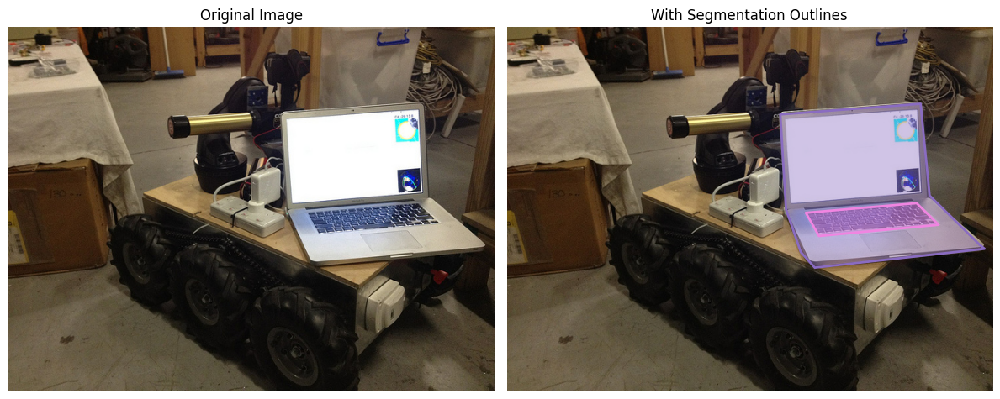

In [15]:
import os
import random
import matplotlib.pyplot as plt
import cv2
from pycocotools.coco import COCO

# ======================
# Step 1: Paths
# ======================
ANN_FILE = "/content/drive/MyDrive/VisionExtract/data/annotations/instances_val2017.json"
IMG_DIR = "/content/drive/MyDrive/VisionExtract/data/coco2017/val2017"

# Load COCO dataset
coco = COCO(ANN_FILE)

# ======================
# Step 2: Pick one random image
# ======================
img_id = random.choice(coco.getImgIds())
img_info = coco.loadImgs(img_id)[0]

# Load image
img_path = os.path.join(IMG_DIR, img_info['file_name'])
image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

# Load annotations
ann_ids = coco.getAnnIds(imgIds=img_id)
anns = coco.loadAnns(ann_ids)

# ======================
# Step 3: Plot Left (Original) + Right (With Outlines)
# ======================
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Left → Original Image
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")

# Right → Image with COCO segmentation outlines
plt.sca(axes[1])  # 👈 switch current axis to the right one
plt.imshow(image)
coco.showAnns(anns)  # overlays pink (or colored) segmentation outlines
plt.title("With Segmentation Outlines")
plt.axis("off")

plt.tight_layout()
plt.show()


loading annotations into memory...
Done (t=0.59s)
creating index...
index created!


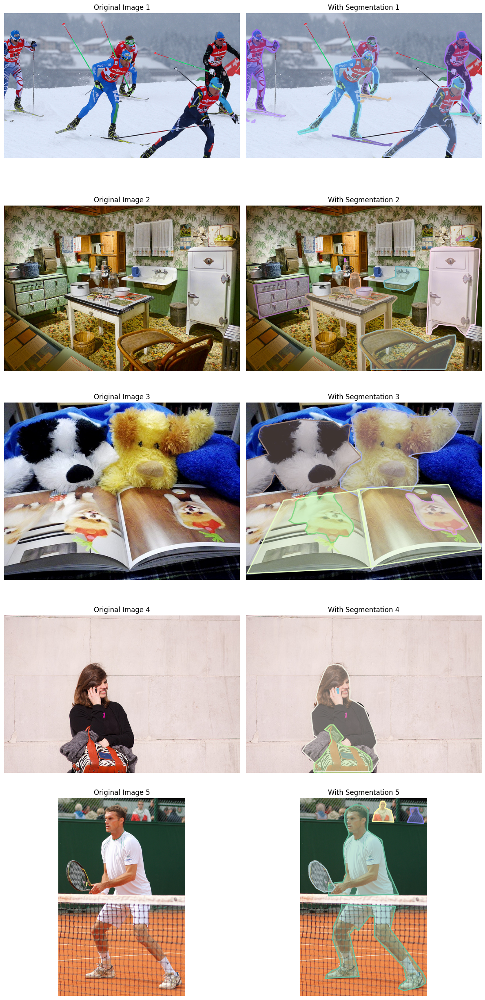

In [18]:
import os
import random
import matplotlib.pyplot as plt
import cv2
from pycocotools.coco import COCO

# ======================
# Step 1: Paths
# ======================
ANN_FILE = "/content/drive/MyDrive/VisionExtract/data/annotations/instances_val2017.json"
IMG_DIR = "/content/drive/MyDrive/VisionExtract/data/coco2017/val2017"

# Load COCO dataset
coco = COCO(ANN_FILE)

# ======================
# Step 2: Pick 5 random images
# ======================
img_ids = random.sample(coco.getImgIds(), 5)

# ======================
# Step 3: Plot 5 rows (Original + Outlines)
# ======================
fig, axes = plt.subplots(5, 2, figsize=(12, 25))  # 5 rows, 2 columns

for i, img_id in enumerate(img_ids):
    # Load image info
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(IMG_DIR, img_info['file_name'])
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    # Load annotations
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    # Left → Original
    axes[i, 0].imshow(image)
    axes[i, 0].set_title(f"Original Image {i+1}")
    axes[i, 0].axis("off")

    # Right → With Segmentation Outlines
    plt.sca(axes[i, 1])  # set current axis to right subplot
    plt.imshow(image)
    coco.showAnns(anns)
    plt.title(f"With Segmentation {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


**10. Display Random Original Images with masked Images:**

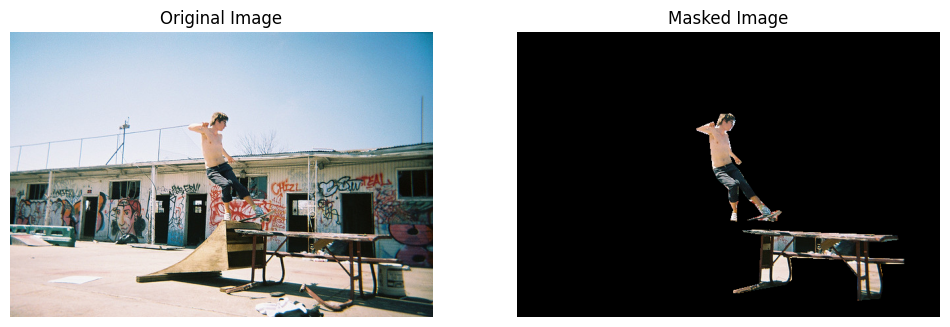

In [10]:
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Pick one random image from COCO validation set
img_id = random.choice(coco.getImgIds())
img_info = coco.loadImgs(img_id)[0]

# Load image
img_path = os.path.join(IMG_DIR, img_info['file_name'])
image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

# Load annotations for that image
ann_ids = coco.getAnnIds(imgIds=img_id)
anns = coco.loadAnns(ann_ids)

# ---- Create Masked Image ----
masked_img = np.zeros_like(image)  # start with black background
for ann in anns:
    mask = coco.annToMask(ann)  # binary mask
    masked_img[mask == 1] = image[mask == 1]  # copy only object pixels

# ---- Plot Side by Side ----
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Left: Original
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")

# Right: Masked
axes[1].imshow(masked_img)
axes[1].set_title("Masked Image")
axes[1].axis("off")

plt.show()


loading annotations into memory...
Done (t=0.63s)
creating index...
index created!


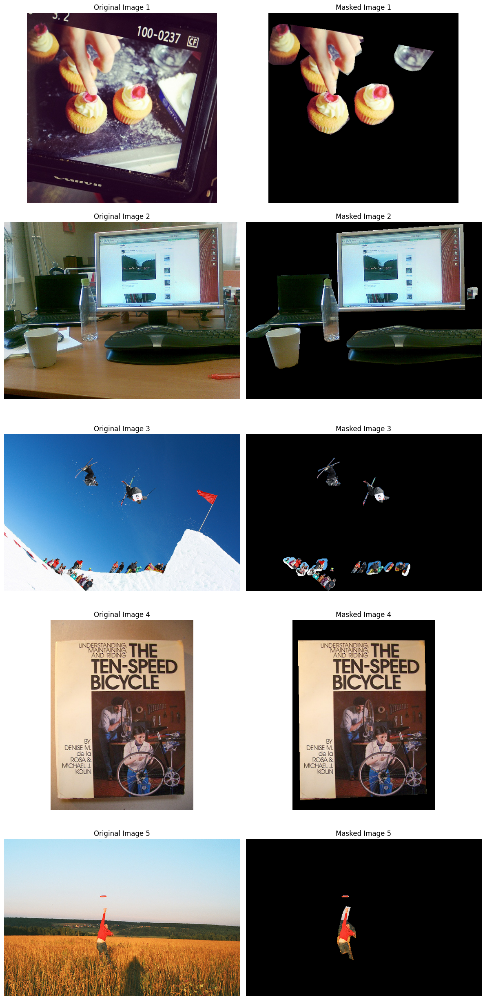

In [9]:
import os
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np
from pycocotools.coco import COCO

# ======================
# Step 1: Paths
# ======================
ANN_FILE = "/content/drive/MyDrive/VisionExtract/data/annotations/instances_val2017.json"
IMG_DIR = "/content/drive/MyDrive/VisionExtract/data/coco2017/val2017"

# Load COCO annotations
coco = COCO(ANN_FILE)

# ======================
# Step 2: Function to Show Original + Masked
# ======================
def show_original_and_masked(num_samples=5):
    # Pick random image IDs
    img_ids = random.sample(coco.getImgIds(), num_samples)

    # Create a figure with num_samples rows and 2 columns
    fig, axes = plt.subplots(num_samples, 2, figsize=(12, 5 * num_samples))

    for i, img_id in enumerate(img_ids):
        # Load image info
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(IMG_DIR, img_info['file_name'])
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

        # Load annotations
        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)

        # Create masked image (start with black)
        masked_img = np.zeros_like(image)
        for ann in anns:
            mask = coco.annToMask(ann)
            masked_img[mask == 1] = image[mask == 1]

        # Show Original
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"Original Image {i+1}")
        axes[i, 0].axis("off")

        # Show Masked
        axes[i, 1].imshow(masked_img)
        axes[i, 1].set_title(f"Masked Image {i+1}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

# ======================
# Step 3: Run for 5 Examples
# ======================
show_original_and_masked(num_samples=5)


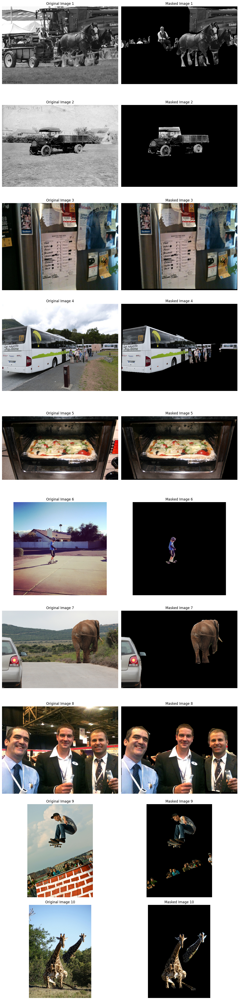

In [12]:
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np

def show_original_and_masked(num_samples=10):
    # Pick random image IDs
    img_ids = random.sample(coco.getImgIds(), num_samples)

    # Create a figure with num_samples rows and 2 columns
    fig, axes = plt.subplots(num_samples, 2, figsize=(12, 5 * num_samples))

    for i, img_id in enumerate(img_ids):
        # Load image info
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(IMG_DIR, img_info['file_name'])
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

        # Load annotations
        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)

        # Create masked image
        masked_img = np.zeros_like(image)
        for ann in anns:
            mask = coco.annToMask(ann)
            masked_img[mask == 1] = image[mask == 1]

        # Show Original
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"Original Image {i+1}")
        axes[i, 0].axis("off")

        # Show Masked
        axes[i, 1].imshow(masked_img)
        axes[i, 1].set_title(f"Masked Image {i+1}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

# 🔹 Run for 10 examples
show_original_and_masked(num_samples=10)

